In [64]:
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Set matplotlib to use retina display for higher resolution plots
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [65]:
def q_ids(pids):
    return "--question_ids=" + ",".join(pids)

def split_into_2024_2025(results):
    results_2024 = [res for res in results if res['problem_id'].startswith('2024')]
    results_2025 = [res for res in results if not res['problem_id'].startswith('2024')]
    print("Number of results in 2024:", len(results_2024))
    print("Number of results in 2025:", len(results_2025))
    return results_2024, results_2025

def extract_problem_ids(data):
    """
    Extracts all problem_id values from the given JSON-like data structure.

    Args:
        data (dict): A dictionary representing the JSON data.

    Returns:
        list: A list of all problem_id values found.
    """
    problem_ids = []
    if "results" in data and isinstance(data["results"], list):
        for item in data["results"]:
            if isinstance(item, dict) and "problem_id" in item:
                problem_ids.append(item["problem_id"])
    print("Number of problem ids:", len(problem_ids))
    return problem_ids



In [66]:
backtracking0 = json.load(open("seed_0/seed0_backtracking_results.json"))
# baseSum0 = json.load(open("pass_consensus/seed1_pass_consensus.json"))
# firstK0 = json.load(open("pass_consensus/seed2_pass_consensus.json"))
# lastK0 = json.load(open("pass_consensus/seed3_pass_consensus.json"))
# postThink0 = json.load(open("pass_consensus/seed4_pass_consensus.json"))

FileNotFoundError: [Errno 2] No such file or directory: 'seed_0/seed0_backtracking_results.json'

In [5]:
backtracking0

{'experiment_name': 'aime_deepseek_qwen_14b_summ_base_sum_4iter_backtracking',
 'config': {'experiment_name': 'aime_deepseek_qwen_14b_summ_base_sum_4iter_backtracking',
  'results_dir': './results/aime_deepseek_qwen_14b_summ_base_sum_4iter_backtracking',
  'data_path': './data/aime_2024_5.csv',
  'save_intermediate': True,
  'experiment_type': 'summarize',
  'dashboard_port': 8080,
  'reasoning_model': 'accounts/vineeth-vajipey-7e1414/deployedModels/deepseek-r1-distill-qwen-14b-xx4lazz0',
  'reasoning_model_provider': 'fireworks',
  'summarizer_type': 'external',
  'summarizer_model': 'accounts/vineeth-vajipey-7e1414/deployedModels/qwen-v2p5-14b-instruct-m86rbdlh',
  'max_tokens': 8192,
  'temperature': 0.6,
  'top_p': 0.95,
  'top_k': 40,
  'presence_penalty': 0.0,
  'frequency_penalty': 0.0,
  'enable_continuation': True,
  'max_total_tokens': 32000,
  'max_continuations': 4,
  'max_iterations': 4,
  'continue_after_correct': True,
  'summary_method': 'single_llm_prompt',
  'enable_s

In [70]:
import os
import json
import pandas as pd

def grade_problem_iterations(problem_data):
    """
    Grades the first 5 iteration attempts for a single problem,
    extracts the year, and uses 1/0 for correctness.

    Args:
        problem_data (dict): A dictionary containing problem details,
                             including 'problem_id', 'correct_answer',
                             and 'iterations' list.

    Returns:
        dict: A dictionary with grading results for the problem.
    """
    problem_id = problem_data.get("problem_id")
    correct_answer_gt = problem_data.get("correct_answer")
    iterations_data = problem_data.get("iterations", [])

    # Determine year based on problem_id
    year = None
    if problem_id is not None and isinstance(problem_id, str): # Ensure problem_id is a string
        if problem_id.startswith('2024'):
            year = 2024
        else:
            # Assuming if not '2024' and problem_id exists, it's '2025'
            # This matches the logic in split_into_2024_2025 where non-2024 is 2025
            year = 2025 
            # If problem_id might not imply 2025 (e.g. '0', '1' from screenshot), 
            # then more robust logic or a default year might be needed.
            # For now, adhering to the provided split logic.
            # If problem_id is something like "0" from the screenshot, it will become 2025.
            # If this needs to be handled differently (e.g. based on source file name or another field),
            # this logic would need adjustment.
            if not problem_id.startswith('2025') and not problem_id.startswith('2024'):
                 # If problem_id is like "0", "1", etc. from initial screenshot, this could be an issue.
                 # Let's assume for now that problem_ids will conform to year-prefix, or we default.
                 # For problem_id "0", it would currently become 2025.
                 pass # Stays 2025 by default if not 2024.

    results = {
        "problem_id": problem_id,
        "year": year, # Add year to results
        "correct_answer_gt": correct_answer_gt,
    }

    for i in range(5):
        results[f"iteration_{i}_answer"] = None
        results[f"iteration_{i}_correct"] = 0 # Default to 0 (False)

    if correct_answer_gt is None:
        for i in range(5):
             results[f"iteration_{i}_answer"] = "N/A - No Ground Truth"
        return results

    for i in range(5): # Check first 5 iterations (0 through 4)
        if i < len(iterations_data):
            iteration_attempt = iterations_data[i]
            if isinstance(iteration_attempt, dict):
                proposed_answer = iteration_attempt.get("answer")
                results[f"iteration_{i}_answer"] = proposed_answer
                
                if proposed_answer is not None:
                    is_correct = (str(proposed_answer).strip() == str(correct_answer_gt).strip())
                    results[f"iteration_{i}_correct"] = 1 if is_correct else 0 # Use 1 or 0
            else:
                results[f"iteration_{i}_answer"] = "Malformed iteration data"
                # Correctness remains 0 (default)
        else:
            results[f"iteration_{i}_answer"] = "N/A - No iteration attempt"
            # Correctness remains 0 (default)
            
    return results

def process_all_experiment_files(base_directory="."):
    """
    Scans specified directories, processes JSON files, grades problems,
    and returns a Pandas DataFrame with all results.

    Args:
        base_directory (str): The root directory containing seed_X folders.
                              Defaults to the current directory.

    Returns:
        pd.DataFrame: A DataFrame containing all aggregated grading results.
    """
    all_graded_results = []
    
    # Corrected seed_folder_names and experiment_types as per your file
    seed_folder_names = [f"seed{i}" for i in range(5)] # seed0 to seed4
    experiment_types = ["backtracking_results", "base_sum_results", "firstk_results", "lastk_results", "postThink_results", "wait", "answer_only"]


    for seed_name in seed_folder_names:
        seed_path = os.path.join(base_directory, seed_name)
        if not os.path.isdir(seed_path):
            print(f"Info: Seed directory not found: {seed_path}. Skipping.")
            continue

        for exp_type in experiment_types:
            # Construct filename: e.g., seed0_backtracking_results.json
            expected_filename = f"{seed_name}_{exp_type}.json"
            file_path = os.path.join(seed_path, expected_filename)

            if os.path.isfile(file_path):
                try:
                    with open(file_path, 'r', encoding='utf-8') as f:
                        data_from_file = json.load(f)
                    
                    if "results" in data_from_file and isinstance(data_from_file["results"], list):
                        problems_in_file = data_from_file["results"]
                        for problem_data_item in problems_in_file:
                            if isinstance(problem_data_item, dict):
                                graded_info = grade_problem_iterations(problem_data_item)
                                graded_info["seed"] = seed_name # seed_name is like "seed0"
                                # experiment_type is like "backtracking_results", remove "_results" for cleaner column value
                                graded_info["experiment_type"] = exp_type.replace("_results", "") 
                                graded_info["source_file"] = expected_filename
                                all_graded_results.append(graded_info)
                            else:
                                print(f"Warning: Item in 'results' list is not a dictionary in {file_path}. Skipping item.")
                    else:
                        print(f"Warning: 'results' key not found or is not a list in {file_path}. File might have unexpected structure. Skipping file.")
                        
                except json.JSONDecodeError:
                    print(f"Error: Could not decode JSON from {file_path}. Skipping file.")
                except Exception as e:
                    print(f"An unexpected error occurred while processing {file_path}: {e}. Skipping file.")
            else:
                print(f"Info: Expected file not found: {file_path}. Skipping.")
    
    if not all_graded_results:
        print("Warning: No results were processed. Returning an empty DataFrame.")
        return pd.DataFrame()
        
    return pd.DataFrame(all_graded_results)

# Main execution part from your provided script
TARGET_BASE_DIRECTORY = "/Users/justinshen/Documents/Code/cocolab/reasoning-distillation/paper_results/" 

print(f"Starting processing in base directory: {os.path.abspath(TARGET_BASE_DIRECTORY)}")
print(f"Expecting seed folders like: {TARGET_BASE_DIRECTORY}seed0/")
print(f"Expecting files like: {TARGET_BASE_DIRECTORY}seed0/seed0_backtracking_results.json")


results_df = process_all_experiment_files(base_directory=TARGET_BASE_DIRECTORY)

if not results_df.empty:
    print("\n--- Aggregated Grading Results ---")
    print(results_df.head())
    
    # Ensure 'year' column is present before trying to print stats on it
    if 'year' in results_df.columns:
        print(f"\nYears found in data: {results_df['year'].unique()}")
    
    output_csv_path = "aggregated_iteration_grading_results_with_year.csv" # New filename
    results_df.to_csv(output_csv_path, index=False)
    print(f"\nResults saved to: {output_csv_path}")

    print("\n--- Basic Statistics ---")
    if 'problem_id' in results_df.columns:
        print(f"Total problems processed (rows): {len(results_df)}")
        print(f"Unique problem IDs: {results_df['problem_id'].nunique()}")
    if 'seed' in results_df.columns:
            print(f"Seeds processed: {results_df['seed'].unique()}")
    if 'experiment_type' in results_df.columns:
            print(f"Experiment types processed: {results_df['experiment_type'].unique()}")

    if 'iteration_0_correct' in results_df.columns:
        iter_0_accuracy = results_df['iteration_0_correct'].mean()
        print(f"Overall Accuracy for Iteration 0: {iter_0_accuracy:.3f}")
else:
    print("No data was processed to create the DataFrame.")

Starting processing in base directory: /Users/justinshen/Documents/Code/cocolab/reasoning-distillation/paper_results
Expecting seed folders like: /Users/justinshen/Documents/Code/cocolab/reasoning-distillation/paper_results/seed0/
Expecting files like: /Users/justinshen/Documents/Code/cocolab/reasoning-distillation/paper_results/seed0/seed0_backtracking_results.json
Info: Seed directory not found: /Users/justinshen/Documents/Code/cocolab/reasoning-distillation/paper_results/seed4. Skipping.

--- Aggregated Grading Results ---
  problem_id  year correct_answer_gt iteration_0_answer  iteration_0_correct  \
0          0  2025               468                468                    1   
1          1  2025                49                 49                    1   
2         10  2025               113                 12                    0   
3         11  2025                19                 71                    0   
4         12  2025               248                396             

In [71]:
results_df

,problem_id,year,correct_answer_gt,iteration_0_answer,iteration_0_correct,iteration_1_answer,iteration_1_correct,iteration_2_answer,iteration_2_correct,iteration_3_answer,iteration_3_correct,iteration_4_answer,iteration_4_correct,seed,experiment_type,source_file
0,0,2025,468,468,1,468,1,468,1,468,1,468,1,seed0,backtracking,seed0_backtracking_results.json
1,1,2025,49,49,1,49,1,49,1,49,1,49,1,seed0,backtracking,seed0_backtracking_results.json
2,10,2025,113,12,0,12,0,12,0,12,0,12,0,seed0,backtracking,seed0_backtracking_results.json
3,11,2025,19,71,0,19,1,19,1,19,1,19,1,seed0,backtracking,seed0_backtracking_results.json
4,12,2025,248,396,0,36,0,36,0,36,0,36,0,seed0,backtracking,seed0_backtracking_results.json
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1675,5,2025,293,293,1,293,1,2557,0,877,0,293,1,seed3,answer_only,seed3_answer_only.json
1676,6,2025,237,None,0,237,1,237,1,60671,0,60671,0,seed3,answer_only,seed3_answer_only.json
1677,7,2025,610,610,1,610,1,610,1,610,1,None,0,seed3,answer_only,seed3_answer_only.json
1678,8,2025,149,149,1,149,1,149,1,149,1,149,1,seed3,answer_only,seed3_answer_only.json


--- Generating Plots ---


/var/folders/hb/lpmy59_93pbcgdhxqxkfs02m0000gn/T/ipykernel_57604/2868294569.py:76: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab20c', len(labels))


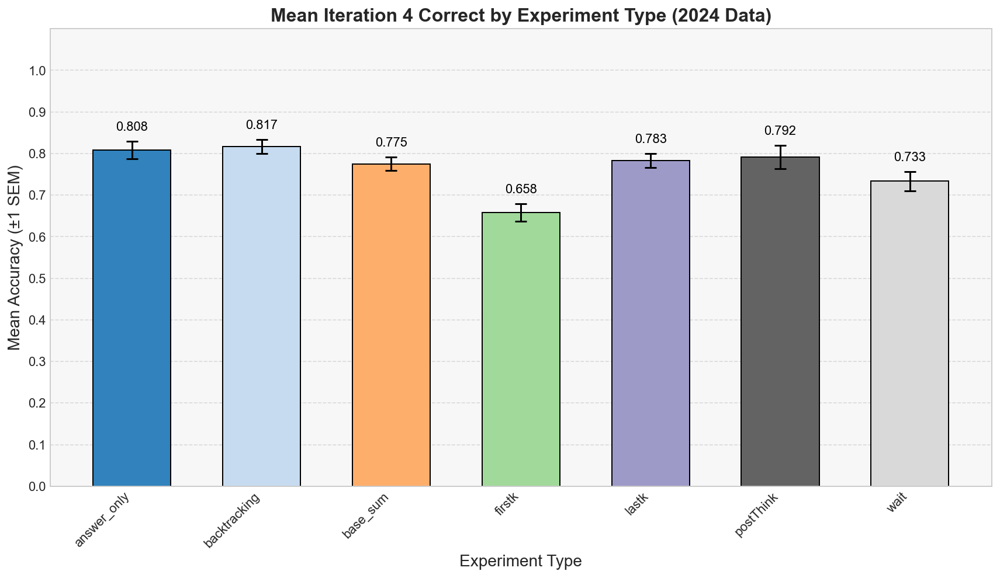

/var/folders/hb/lpmy59_93pbcgdhxqxkfs02m0000gn/T/ipykernel_57604/2868294569.py:76: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab20c', len(labels))



Summary Statistics for iteration_4_correct (2024 Data):
  experiment_type  mean_accuracy  sem_accuracy
0     answer_only       0.808333      0.020972
1    backtracking       0.816667      0.016667
2        base_sum       0.775000      0.015957
3          firstk       0.658333      0.020972
4           lastk       0.783333      0.016667
5       postThink       0.791667      0.028464
6            wait       0.733333      0.023570


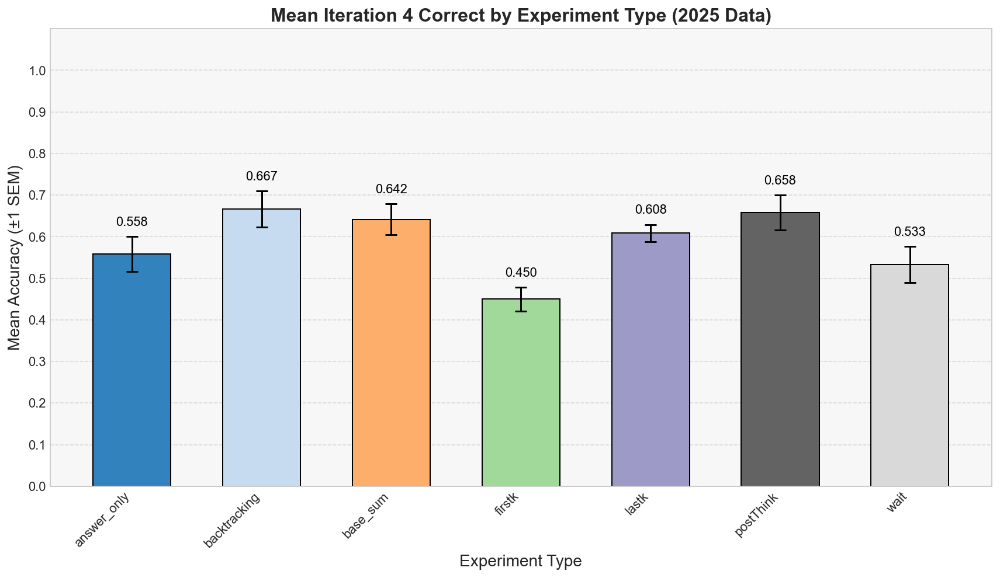


Summary Statistics for iteration_4_correct (2025 Data):
  experiment_type  mean_accuracy  sem_accuracy
0     answer_only       0.558333      0.041667
1    backtracking       0.666667      0.043033
2        base_sum       0.641667      0.036956
3          firstk       0.450000      0.028868
4           lastk       0.608333      0.020972
5       postThink       0.658333      0.041667
6            wait       0.533333      0.043033


/var/folders/hb/lpmy59_93pbcgdhxqxkfs02m0000gn/T/ipykernel_57604/2868294569.py:76: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab20c', len(labels))


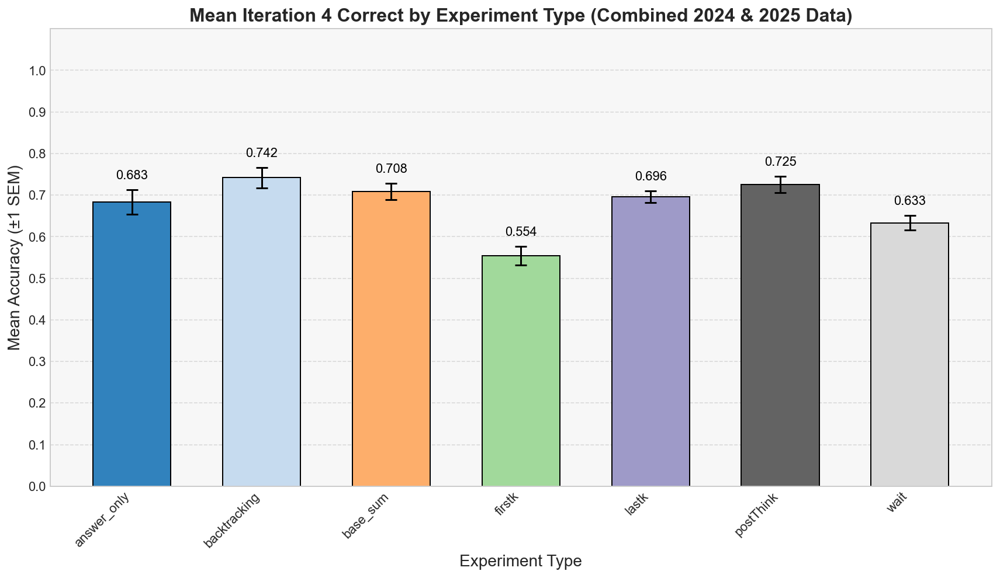


Summary Statistics for iteration_4_correct (Combined 2024 & 2025 Data):
  experiment_type  mean_accuracy  sem_accuracy
0     answer_only       0.683333      0.028868
1    backtracking       0.741667      0.025000
2        base_sum       0.708333      0.019837
3          firstk       0.554167      0.021916
4           lastk       0.695833      0.014232
5       postThink       0.725000      0.019837
6            wait       0.633333      0.018002


In [72]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import sem # For Standard Error of the Mean

def plot_iteration_accuracy_by_experiment_type(results_df, iteration_col='iteration_4_correct', plot_title_suffix=""):
    """
    Calculates and plots the mean accuracy for a specified iteration column,
    grouped by experiment_type, using each seed as a data point for mean/SEM.
    The plot title can be customized with a suffix.

    Args:
        results_df (pd.DataFrame): DataFrame containing the grading results.
                                   Must include 'experiment_type', 'seed', 'year',
                                   and the specified 'iteration_col'.
        iteration_col (str): The name of the iteration correctness column to analyze.
        plot_title_suffix (str): Suffix to append to the plot title (e.g., "(2024 Data)").
    """
    if results_df.empty:
        print(f"Input DataFrame is empty for suffix '{plot_title_suffix}'. Cannot generate plot for {iteration_col}.")
        return

    if iteration_col not in results_df.columns:
        print(f"Column '{iteration_col}' not found in DataFrame for suffix '{plot_title_suffix}'. Cannot generate plot.")
        return
        
    if 'experiment_type' not in results_df.columns or 'seed' not in results_df.columns:
        print(f"Required columns 'experiment_type' or 'seed' not found for suffix '{plot_title_suffix}'. Cannot generate plot.")
        return

    # Ensure the iteration column is numeric (0s and 1s)
    # Create a copy to avoid SettingWithCopyWarning if results_df is a slice
    df_to_process = results_df.copy()
    df_to_process[iteration_col] = pd.to_numeric(df_to_process[iteration_col], errors='coerce')
    
    cleaned_df = df_to_process.dropna(subset=[iteration_col])
    if cleaned_df.empty:
        print(f"DataFrame is empty after cleaning NaNs from '{iteration_col}' for suffix '{plot_title_suffix}'. Cannot generate plot.")
        return

    seed_level_accuracies = cleaned_df.groupby(['experiment_type', 'seed'])[iteration_col].mean()

    if seed_level_accuracies.empty:
        print(f"No seed-level accuracies could be calculated for {iteration_col} for suffix '{plot_title_suffix}'. Check data diversity.")
        return

    experiment_summary_stats = []
    unique_experiment_types = seed_level_accuracies.index.get_level_values('experiment_type').unique()

    for exp_type in unique_experiment_types:
        accuracies_for_exp_type = seed_level_accuracies.loc[exp_type]
        mean_acc = accuracies_for_exp_type.mean()
        sem_acc = sem(accuracies_for_exp_type) if len(accuracies_for_exp_type) > 1 else 0
            
        experiment_summary_stats.append({
            'experiment_type': exp_type,
            'mean_accuracy': mean_acc,
            'sem_accuracy': sem_acc
        })

    if not experiment_summary_stats:
        print(f"No summary statistics generated for {iteration_col} for suffix '{plot_title_suffix}'. Plot cannot be created.")
        return

    summary_df = pd.DataFrame(experiment_summary_stats)
    summary_df = summary_df.sort_values(by='experiment_type') # Sort for consistent plot order

    plt.style.use('seaborn-v0_8-whitegrid')
    fig, ax = plt.subplots(figsize=(12, 7))

    labels = summary_df['experiment_type']
    means = summary_df['mean_accuracy']
    sems = summary_df['sem_accuracy']


    colors = plt.cm.get_cmap('tab20c', len(labels))

    bars = ax.bar(labels, means, yerr=sems, capsize=5, 
                  color=[colors(i) for i in range(len(labels))], width=0.6, 
                  edgecolor='black', ecolor='black', 
                  error_kw={'elinewidth':1.5, 'capthick':1.5})

    title_base = f'Mean {iteration_col.replace("_", " ").title()} by Experiment Type'
    full_title = f'{title_base} {plot_title_suffix}'
    ax.set_ylabel(f'Mean Accuracy (±1 SEM)', fontsize=14) # Simplified Y-axis label
    ax.set_xlabel('Experiment Type', fontsize=14)
    ax.set_title(full_title.strip(), fontsize=16, fontweight='bold')
    ax.set_ylim(0, 1.1)

    for bar in bars:
        yval = bar.get_height()
        current_sem = sems.iloc[bars.patches.index(bar)] if not pd.isna(sems.iloc[bars.patches.index(bar)]) else 0
        label_y_offset = 0.02
        label_position = yval + current_sem + label_y_offset
        if label_position > ax.get_ylim()[1] * 0.98 : # Adjust if label goes too high
             label_position = yval - (current_sem + label_y_offset) if yval - (current_sem + label_y_offset) > 0 else yval + label_y_offset/2
        if label_position < ax.get_ylim()[0] + 0.02: # Adjust if label goes too low (e.g. for zero bars)
            label_position = yval + label_y_offset


        plt.text(bar.get_x() + bar.get_width()/2.0, label_position,
                 f'{yval:.3f}', ha='center', va='bottom', fontsize=11, color='black', fontweight='medium')

    plt.xticks(rotation=45, ha="right", fontsize=11)
    plt.yticks(np.arange(0, 1.1, 0.1), fontsize=11)
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    ax.grid(axis='x', linestyle='')
    ax.set_facecolor('#f7f7f7')
    fig.patch.set_facecolor('white')
    plt.tight_layout()
    plt.show()

    print(f"\nSummary Statistics for {iteration_col} {plot_title_suffix}:")
    print(summary_df)

print("--- Generating Plots ---")

# --- 1. Plot for 2024 Data ---
df_2024 = results_df[results_df['year'] == 2024]
if not df_2024.empty:
    plot_iteration_accuracy_by_experiment_type(df_2024, 
                                                iteration_col='iteration_4_correct', 
                                                plot_title_suffix="(2024 Data)")
else:
    print("No data available for 2024 to plot.")

# --- 2. Plot for 2025 Data ---
df_2025 = results_df[results_df['year'] == 2025]
if not df_2025.empty:
    plot_iteration_accuracy_by_experiment_type(df_2025, 
                                                iteration_col='iteration_4_correct', 
                                                plot_title_suffix="(2025 Data)")
else:
    print("No data available for 2025 to plot.")

# --- 3. Plot for Combined Data ---
# Make sure year column exists for this check
if 'year' in results_df.columns and (2024 in results_df['year'].unique() or 2025 in results_df['year'].unique()):
        plot_iteration_accuracy_by_experiment_type(results_df, # Use the original (or relevant combined) DataFrame
                                                iteration_col='iteration_4_correct',
                                                plot_title_suffix="(Combined 2024 & 2025 Data)")
else:
    print("No data available for combined plot (ensure 'year' column is present and has 2024 or 2025 values).")


Loading data from: aggregated_iteration_grading_results_with_year.csv

--- Analyzing and Plotting for: iteration_4_correct ---


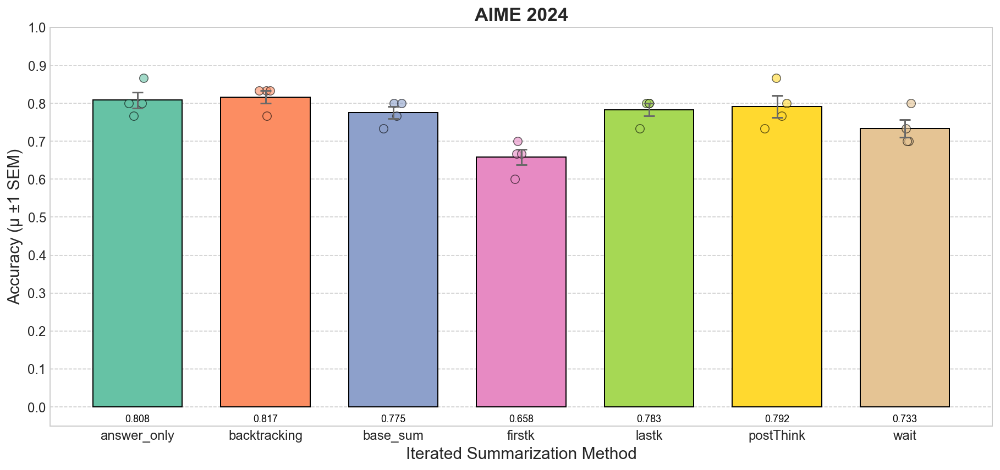


Summary Statistics for iteration_4_correct AIME 2024:
  experiment_type  mean_accuracy  sem_accuracy
0     answer_only       0.808333      0.020972
1    backtracking       0.816667      0.016667
2        base_sum       0.775000      0.015957
3          firstk       0.658333      0.020972
4           lastk       0.783333      0.016667
5       postThink       0.791667      0.028464
6            wait       0.733333      0.023570


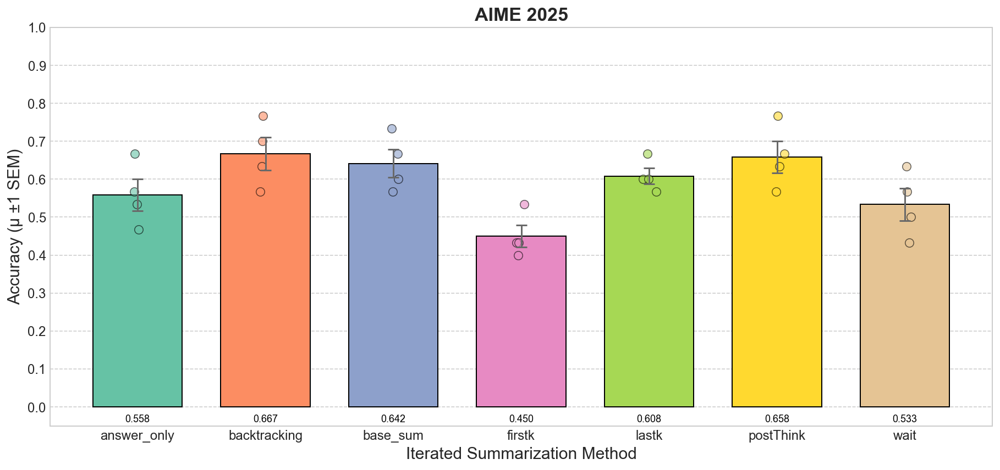


Summary Statistics for iteration_4_correct AIME 2025:
  experiment_type  mean_accuracy  sem_accuracy
0     answer_only       0.558333      0.041667
1    backtracking       0.666667      0.043033
2        base_sum       0.641667      0.036956
3          firstk       0.450000      0.028868
4           lastk       0.608333      0.020972
5       postThink       0.658333      0.041667
6            wait       0.533333      0.043033


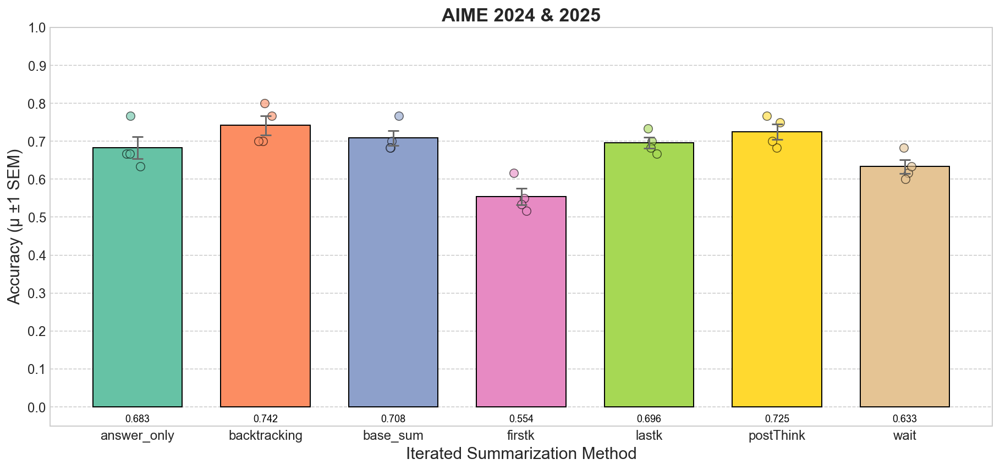


Summary Statistics for iteration_4_correct AIME 2024 & 2025:
  experiment_type  mean_accuracy  sem_accuracy
0     answer_only       0.683333      0.028868
1    backtracking       0.741667      0.025000
2        base_sum       0.708333      0.019837
3          firstk       0.554167      0.021916
4           lastk       0.695833      0.014232
5       postThink       0.725000      0.019837
6            wait       0.633333      0.018002


In [73]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import sem # For Standard Error of the Mean
import os # For path joining if loading from CSV

# --- Function to plot accuracies (from your provided snippet) ---
def plot_iteration_accuracy_by_experiment_type(results_df, iteration_col='iteration_4_correct', 
                                               plot_title_suffix="", scatter_data=None):
    """
    Calculates and plots the mean accuracy for a specified iteration column,
    grouped by experiment_type, using each seed as a data point for mean/SEM.
    The plot title can be customized with a suffix.
    Optionally overlays scatter plot of raw data points.

    Args:
        results_df (pd.DataFrame): DataFrame containing the grading results.
                                   Must include 'experiment_type', 'seed', 
                                   and the specified 'iteration_col'.
        iteration_col (str): The name of the iteration correctness column to analyze.
        plot_title_suffix (str): Suffix to append to the plot title (e.g., "(2024 Data)").
        scatter_data (dict, optional): Data for scatter plot. 
                                       Keys should match bar labels (experiment_type).
                                       Values should be lists of raw data points.
    """
    if results_df.empty:
        print(f"Input DataFrame is empty for suffix '{plot_title_suffix}'. Cannot generate plot for {iteration_col}.")
        return

    required_cols = ['experiment_type', 'seed', iteration_col]
    missing_cols = [col for col in required_cols if col not in results_df.columns]
    if missing_cols:
        print(f"Missing required columns: {missing_cols} for suffix '{plot_title_suffix}'. Cannot generate plot.")
        return

    df_to_process = results_df.copy()
    df_to_process[iteration_col] = pd.to_numeric(df_to_process[iteration_col], errors='coerce')
    cleaned_df = df_to_process.dropna(subset=[iteration_col])

    if cleaned_df.empty:
        print(f"DataFrame is empty after cleaning NaNs from '{iteration_col}' for suffix '{plot_title_suffix}'.")
        return

    # Calculate per-seed accuracies for the current subset (e.g., 2024 data)
    # These are the *values* that will be averaged for the bars, and also used as scatter if not aggregated further
    seed_level_accuracies = cleaned_df.groupby(['experiment_type', 'seed'])[iteration_col].mean()

    if seed_level_accuracies.empty:
        print(f"No seed-level accuracies for {iteration_col} for suffix '{plot_title_suffix}'.")
        return

    # Calculate mean and SEM across seeds for each experiment_type (for the bars)
    experiment_summary_stats = []
    unique_experiment_types = sorted(seed_level_accuracies.index.get_level_values('experiment_type').unique())

    for exp_type in unique_experiment_types:
        accuracies_for_exp_type_seeds = seed_level_accuracies.loc[exp_type] # Accuracies for this exp_type from its seeds
        mean_acc = accuracies_for_exp_type_seeds.mean()
        sem_acc = sem(accuracies_for_exp_type_seeds) if len(accuracies_for_exp_type_seeds) > 1 else 0
        experiment_summary_stats.append({
            'experiment_type': exp_type,
            'mean_accuracy': mean_acc,
            'sem_accuracy': sem_acc
        })

    if not experiment_summary_stats:
        print(f"No summary stats for {iteration_col} for suffix '{plot_title_suffix}'.")
        return

    summary_df = pd.DataFrame(experiment_summary_stats)
    # summary_df = summary_df.sort_values(by='experiment_type') # Already sorted by unique_experiment_types

    plt.style.use('seaborn-v0_8-whitegrid')
    fig, ax = plt.subplots(figsize=(14, 8)) # Adjusted figsize

    labels = summary_df['experiment_type']
    means = summary_df['mean_accuracy']
    sems = summary_df['sem_accuracy']
    
    # Use a consistent color map for experiment types across plots if possible
    # cmap = plt.cm.get_cmap('tab20c', len(labels) if len(labels) > 0 else 1) # Ensure at least 1 color for cmap
    # colors = [cmap(i) for i in range(len(labels))]
    
    # Define a fixed palette to try and keep colors consistent if experiment types are the same
    exp_types_palette = {exp: plt.cm.Set2(i / len(unique_experiment_types)) for i, exp in enumerate(unique_experiment_types)}
    bar_colors_list = [exp_types_palette.get(exp, 'gray') for exp in labels]


    bars = ax.bar(labels, means, yerr=sems, capsize=5,
                  color=bar_colors_list, width=0.7, # Adjusted width
                  edgecolor='black', ecolor='dimgray', # Darker ecolor for SEM bars
                  error_kw={'elinewidth':1.5, 'capthick':1.5, 'zorder': 10}) # SEM on top

    # --- Add scatter points ---
    if scatter_data:
        for i, exp_label in enumerate(labels): # labels are sorted experiment_types
            if exp_label in scatter_data and scatter_data[exp_label]:
                points_to_scatter = scatter_data[exp_label]
                jitter = np.random.normal(0, 0.035, size=len(points_to_scatter)).clip(-0.12, 0.12) # Increased jitter slightly
                ax.scatter([i + j for j in jitter], points_to_scatter,
                           color=exp_types_palette.get(exp_label, 'gray'), # Match bar color
                           alpha=0.6, zorder=5, s=60, # Increased size and alpha
                           edgecolor='k', linewidth=0.75)


    title_base = f'Mean {iteration_col.replace("_", " ").title()} by Experiment Type'
    # full_title = f'{title_base} {plot_title_suffix}'
    full_title = f'{plot_title_suffix}'

    ax.set_ylabel(f'Accuracy (μ ±1 SEM)', fontsize=15)
    ax.set_xlabel('Iterated Summarization Method', fontsize=15)
    ax.set_title(full_title.strip(), fontsize=17, fontweight='bold')
    ax.set_ylim(-0.05, 1) # Ensure some space below 0 for labels if needed

    for i, bar in enumerate(bars): # Iterate through bars to get x position for text
        yval = means.iloc[i] # Use the mean value for the label
        # Position text below the x-axis
        text_y_pos = -0.02
    
        plt.text(bar.get_x() + bar.get_width()/2.0, text_y_pos, f'{yval:.3f}',
                 ha='center', va='top', fontsize=9, color='black',
                 bbox=dict(facecolor='white', alpha=0.0, pad=0, edgecolor='none'))


    plt.xticks(fontsize=12) # Increased font size
    plt.yticks(np.arange(0, 1.1, 0.1), fontsize=12)
    ax.grid(axis='y', linestyle='--', alpha=1)
    ax.grid(axis='x', linestyle='')
    # ax.set_facecolor('#f9f9f9') # Slightly lighter background
    fig.patch.set_facecolor('white')
    plt.subplots_adjust(bottom=0.25, left=0.1, right=0.95) # Adjust margins
    plt.show()

    print(f"\nSummary Statistics for {iteration_col} {plot_title_suffix}:")
    print(summary_df[['experiment_type', 'mean_accuracy', 'sem_accuracy']])


# --- Main script execution starts here ---

# Placeholder: Load your main DataFrame `results_df`
# This DataFrame should be the output of your grading script (e.g., grade_iterations.py)
# It needs columns: 'problem_id', 'year', 'seed', 'experiment_type', 
# and iteration correctness columns like 'iteration_0_correct', ..., 'iteration_4_correct'.

RESULTS_DF_PATH = "aggregated_iteration_grading_results_with_year.csv" # Example path

if os.path.exists(RESULTS_DF_PATH):
    print(f"Loading data from: {RESULTS_DF_PATH}")
    results_df = pd.read_csv(RESULTS_DF_PATH)
else:
    print(f"Error: Results DataFrame file not found at {RESULTS_DF_PATH}.")
    print("Please generate this file using your grading script or provide the correct path.")
    # Creating a dummy DataFrame for demonstration if file not found
    print("Creating a dummy DataFrame for demonstration purposes.")
    num_samples = 100
    seeds = [f'seed{i}' for i in range(5)] # s0, s1, s2, s3, s4
    exp_types = ['backtracking', 'base_sum', 'firstk', 'lastk', 'postThink', 'wait']
    results_data = {
        'problem_id': [f'P{i}' for i in range(num_samples)],
        'year': np.random.choice([2024, 2025], num_samples),
        'seed': np.random.choice(seeds, num_samples),
        'experiment_type': np.random.choice(exp_types, num_samples),
        'iteration_0_correct': np.random.randint(0, 2, num_samples),
        'iteration_1_correct': np.random.randint(0, 2, num_samples),
        'iteration_2_correct': np.random.randint(0, 2, num_samples),
        'iteration_3_correct': np.random.randint(0, 2, num_samples),
        'iteration_4_correct': np.random.randint(0, 2, num_samples),
    }
    results_df = pd.DataFrame(results_data)
    print("Dummy DataFrame created:")
    print(results_df.head())

# --- Ensure 'year' column is present and of a consistent type if it exists ---
if 'year' in results_df.columns:
    results_df['year'] = pd.to_numeric(results_df['year'], errors='coerce') # Coerce to numeric, non-convertibles become NaT/NaN
    results_df.dropna(subset=['year'], inplace=True) # Drop rows where year could not be converted
    results_df['year'] = results_df['year'].astype(int) # Convert to int after NaNs are handled


ITERATION_TO_ANALYZE = 'iteration_4_correct' # Define which iteration you want to analyze

if ITERATION_TO_ANALYZE not in results_df.columns:
    print(f"Error: Column '{ITERATION_TO_ANALYZE}' not found in the loaded DataFrame. Exiting.")
else:
    print(f"\n--- Analyzing and Plotting for: {ITERATION_TO_ANALYZE} ---")

    # Prepare scatter data: per-seed accuracy for each experiment_type (overall, not split by year yet for this dict)
    # This dictionary will be filtered by year within the plotting calls.
    # scatter_data_points = results_df.groupby(['experiment_type', 'seed', 'year'])[ITERATION_TO_ANALYZE].mean().reset_index()
    # The above is one way, or more simply, just pass the relevant slice of results_df
    # and let the plotting function's internal groupby handle it for scatter.
    # No, we need to pre-calculate per-seed means to scatter.

    # Calculate per-seed means for each experiment_type (this will be used for scattering)
    # { 'experiment_type1': {'2024': [seed0_acc, seed1_acc,...], '2025': [seed0_acc, seed1_acc,...]}, ... }
    
    per_seed_means_for_scatter = {}
    if 'experiment_type' in results_df.columns and 'seed' in results_df.columns and 'year' in results_df.columns:
        grouped_for_scatter = results_df.groupby(['experiment_type', 'seed', 'year'])[ITERATION_TO_ANALYZE].mean()
        for (exp_type, seed, year_val), acc in grouped_for_scatter.items():
            if exp_type not in per_seed_means_for_scatter:
                per_seed_means_for_scatter[exp_type] = {'2024': [], '2025': []}
            if year_val == 2024:
                per_seed_means_for_scatter[exp_type]['2024'].append(acc)
            elif year_val == 2025:
                per_seed_means_for_scatter[exp_type]['2025'].append(acc)


    # --- 1. Plot for 2024 Data ---
    if 'year' in results_df.columns:
        df_2024 = results_df[results_df['year'] == 2024]
        if not df_2024.empty:
            scatter_2024 = {exp: data_by_year['2024'] 
                            for exp, data_by_year in per_seed_means_for_scatter.items() 
                            if '2024' in data_by_year and data_by_year['2024']}
            plot_iteration_accuracy_by_experiment_type(df_2024, 
                                                       iteration_col=ITERATION_TO_ANALYZE, 
                                                       plot_title_suffix="AIME 2024",
                                                       scatter_data=scatter_2024)
        else:
            print("No data available for 2024 to plot.")
    else:
        print("Warning: 'year' column not found. Cannot generate 2024-specific plot.")

    # --- 2. Plot for 2025 Data ---
    if 'year' in results_df.columns:
        df_2025 = results_df[results_df['year'] == 2025]
        if not df_2025.empty:
            scatter_2025 = {exp: data_by_year['2025'] 
                            for exp, data_by_year in per_seed_means_for_scatter.items()
                            if '2025' in data_by_year and data_by_year['2025']}
            plot_iteration_accuracy_by_experiment_type(df_2025, 
                                                       iteration_col=ITERATION_TO_ANALYZE, 
                                                       plot_title_suffix="AIME 2025",
                                                       scatter_data=scatter_2025)
        else:
            print("No data available for 2025 to plot.")
    else:
        print("Warning: 'year' column not found. Cannot generate 2025-specific plot.")


    # --- 3. Plot for Combined Data ---
    # For combined, scatter points for each experiment type would be its per-seed accuracies pooled across years
    scatter_combined = {}
    if 'experiment_type' in results_df.columns and 'seed' in results_df.columns:
        grouped_combined_scatter = results_df.groupby(['experiment_type', 'seed'])[ITERATION_TO_ANALYZE].mean()
        for (exp_type, seed), acc in grouped_combined_scatter.items():
            if exp_type not in scatter_combined:
                scatter_combined[exp_type] = []
            scatter_combined[exp_type].append(acc)

    plot_iteration_accuracy_by_experiment_type(results_df, 
                                               iteration_col=ITERATION_TO_ANALYZE,
                                               plot_title_suffix="AIME 2024 & 2025",
                                               scatter_data=scatter_combined)